# Этап 1. Исследовательский анализ данных (EDA)
Анализ датасета **train_dataset_for_students** для обучения модели семантической сегментации.

Цель: исследовать данные перед обучением модели семантической сегментации.
- Размер изображений: 256×256 пикселей
- Классы: 0 — фон, 1 — кошка, 2 — собака
- Структура датасета: 

```
train_dataset_for_students/
    ├── img/
    │ ├── test/ (120 .jpg)
    │ ├── train/ (200 .jpg)
    │ └── val/ (120 .jpg)
    └── labels/
      ├── test/ (120 .png)
      ├── train/ (200 .png)
      └── val/ (120 .png)
```

## Инициализация

In [1]:
import os
import cv2
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

# Убедимся, что работаем из корня проекта
while 'mmsegmentation' in os.getcwd():
    os.chdir('../')

os.chdir('mmsegmentation')

data_root = "practicum_work/data/train_dataset_for_students"
train_img_dir = os.path.join(data_root, "img", "train")
train_mask_dir = os.path.join(data_root, "labels", "train")
val_img_dir = os.path.join(data_root, "img", "val")
val_mask_dir = os.path.join(data_root, "labels", "val")
test_img_dir = os.path.join(data_root, "img", "test")
test_mask_dir = os.path.join(data_root, "labels", "test")

for path in [train_img_dir, train_mask_dir, val_img_dir, val_mask_dir, test_img_dir, test_mask_dir]:
    assert os.path.exists(path), f"Путь не найден: {path}"

data_splits = [
    {"name": "train", "paths": [train_img_dir, train_mask_dir]},
    {"name": "val",   "paths": [val_img_dir, val_mask_dir]},
    {"name": "test",  "paths": [test_img_dir, test_mask_dir]}
]

## 1.1 Оценка качества датасета
Выполним ряд автоматизированных проверок датасета, чтобы выявить некачественные семплы и решить какую стратегию обработки выбрать.

### 1.1.1 Проверка соответствия изображений и масок
Проверяем, что для каждого изображения есть соответствующая маска (и наоборот).

In [4]:
from practicum_work.scripts.eda_utils import check_image_mask_pairs

for split in data_splits:
    print(split["name"])
    check_image_mask_pairs(split["paths"][0], split["paths"][1])

train
✅ Все файлы имеют пары.
val
✅ Все файлы имеют пары.
test
✅ Все файлы имеют пары.


### 1.1.2 Проверка корректности размеров изображений и масок
Проверяем, что изображения и маски имеют правильный размер.

In [2]:
from practicum_work.scripts.eda_utils import check_image_mask_size_consistency

for split in data_splits:
    print(split["name"])
    check_image_mask_size_consistency(split["paths"][0], split["paths"][1])

train
✅ Все изображения и маски имеют правильный размер.
val
✅ Все изображения и маски имеют правильный размер.
test
✅ Все изображения и маски имеют правильный размер.


### 1.1.3 Проверка классов в масках
Проверяем, что в масках только разрешённые классы.

In [3]:
from practicum_work.scripts.eda_utils import check_mask_valid_classes

for split in data_splits:
    print(split["name"])
    check_mask_valid_classes(split["paths"][1])

train
✅ Все маски имеют допустимые классы.
val
✅ Все маски имеют допустимые классы.
test
✅ Все маски имеют допустимые классы.


### 1.1.4 Проверка пересечения классов: один пиксель — два объекта
Проверяем, нет ли пикселей, где одновременно присутствуют кот и собака.

In [2]:
from practicum_work.scripts.eda_utils import check_class_overlap

for split in data_splits:
    print(split["name"])
    check_class_overlap(split["paths"][1])

train
✅ Пересечение классов не обнаружено.
val
✅ Пересечение классов не обнаружено.
test
✅ Пересечение классов не обнаружено.


### 1.1.5 Проверка пустых и полностью заполненных масок
Проверяем, что маски не пустые (нет объектов) или полностью заполненные.

In [4]:
from practicum_work.scripts.eda_utils import check_empty_or_full_masks

for split in data_splits:
    print(split["name"])
    check_empty_or_full_masks(split["paths"][1])

train
✅ Нет масок без объектов и масок полностью заполненных объектами.
val
✅ Нет масок без объектов и масок полностью заполненных объектами.
test
✅ Нет масок без объектов и масок полностью заполненных объектами.


### 1.1.6 Проверка на "дробные" объекты: слишком много отдельных компонент
Проверяем, не разбит ли объект (кот/собака) на слишком много фрагментов.

train
Слишком много фрагментов объекта (7): 000000016206_4014.png
Слишком много фрагментов объекта (8): 000000121530_5761.png
Слишком много фрагментов объекта (6): 000000247301_4455.png
Слишком много фрагментов объекта (6): 000000308687_3712.png


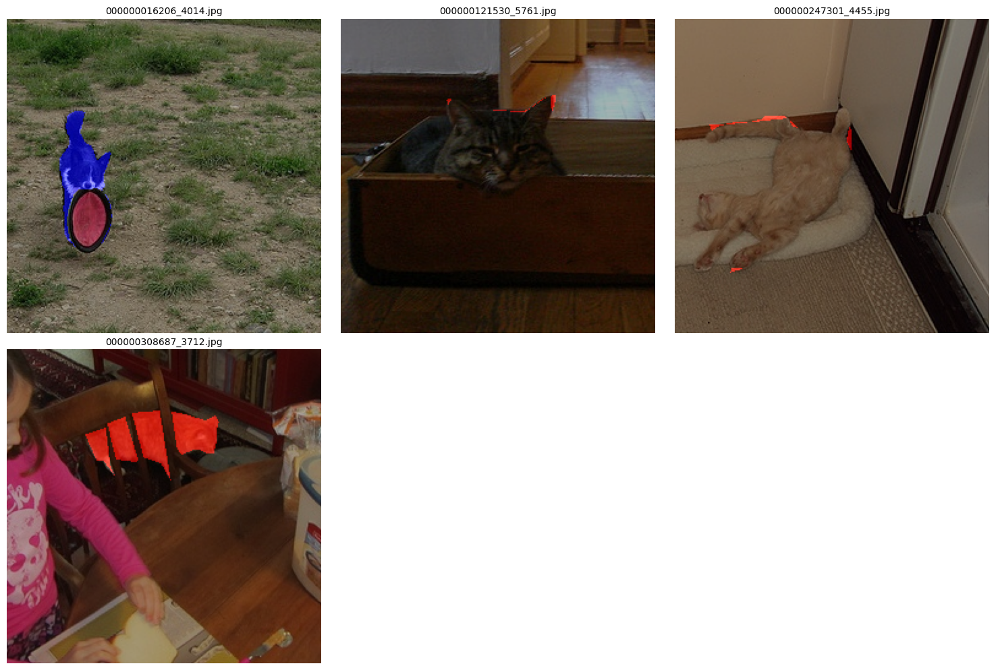

val
✅ Подозрительно фрагментированных объектов не обнаружено.
test
✅ Подозрительно фрагментированных объектов не обнаружено.


In [6]:
from practicum_work.scripts.eda_utils import check_too_many_components
from practicum_work.scripts.eda_utils import process_warnings
from practicum_work.scripts.visual_utils import visualize_images

for split in data_splits:
    print(split["name"])
    warnings = check_too_many_components(split["paths"][1])
    if warnings:
        images, masks = process_warnings(warnings)
        visualize_images(images, masks)

### 1.1.7 Проверка шума в масках
Проверяем наличие мелких изолированных регионов (возможно, шум разметки).

train
Маска 000000016206_4014.png содержит 5 мелких фрагментов (возможно, шум)
Маска 000000121530_5761.png содержит 4 мелких фрагментов (возможно, шум)
Маска 000000246879_5659.png содержит 2 мелких фрагментов (возможно, шум)
Маска 000000275919_4499.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000285257_4973.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000307073_1489.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000308687_3712.png содержит 2 мелких фрагментов (возможно, шум)
Маска 000000310262_1601.png содержит 2 мелких фрагментов (возможно, шум)
Маска 000000328760_6588.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000474434_3544.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000574769_0.png содержит 2 мелких фрагментов (возможно, шум)


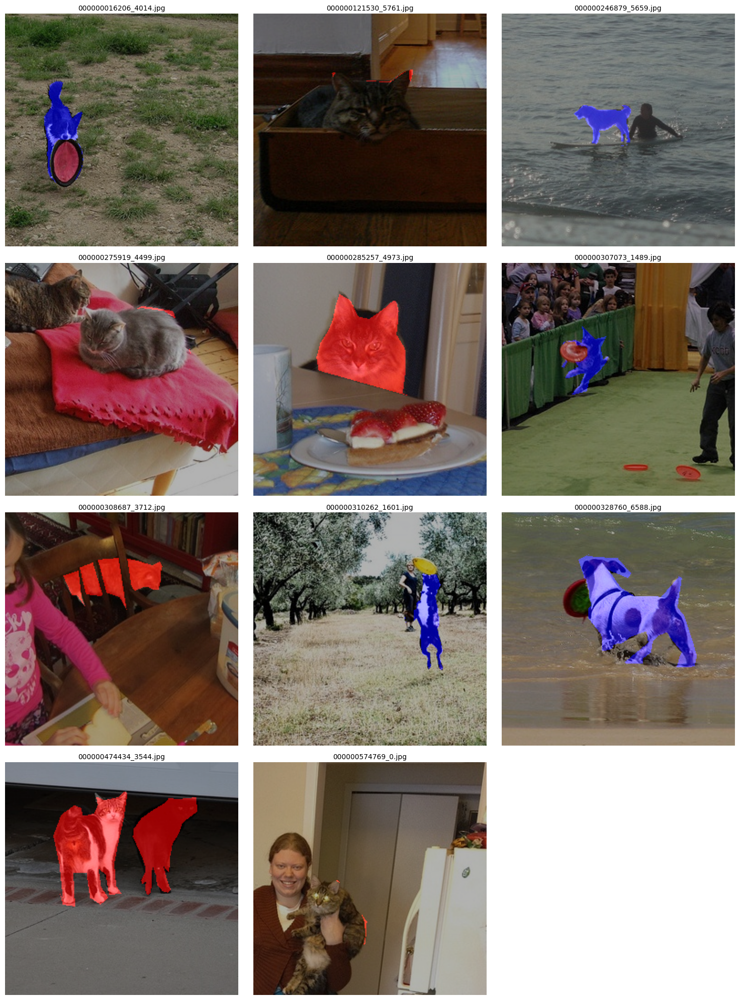

val
Маска 000000026310_3053.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000209731_4128.png содержит 1 мелких фрагментов (возможно, шум)


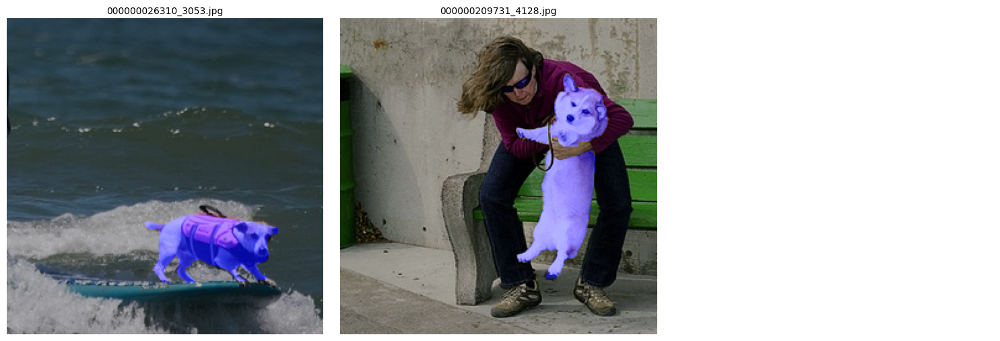

test
Маска 000000258129_3143.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000324772_4097.png содержит 1 мелких фрагментов (возможно, шум)
Маска 000000352558_5800.png содержит 2 мелких фрагментов (возможно, шум)
Маска 000000358545_4807.png содержит 2 мелких фрагментов (возможно, шум)


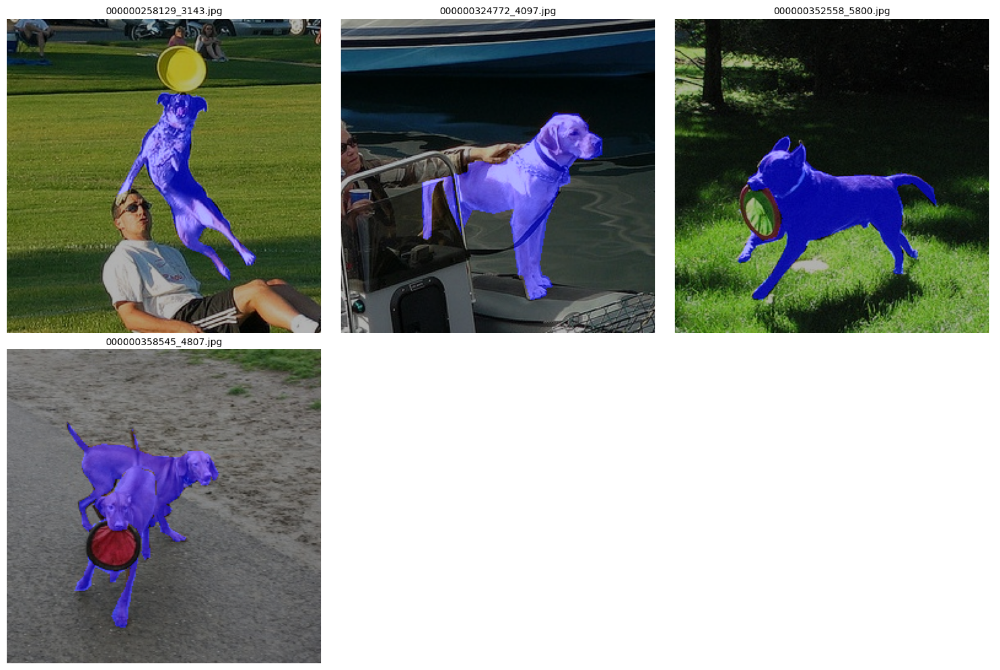

In [4]:
from practicum_work.scripts.eda_utils import check_isolated_noise_pixels
from practicum_work.scripts.eda_utils import process_warnings
from practicum_work.scripts.visual_utils import visualize_images

for split in data_splits:
    print(split["name"])
    warnings = check_isolated_noise_pixels(split["paths"][1])
    if warnings:
        images, masks = process_warnings(warnings)
        visualize_images(images, masks)

### 1.1.8 Проверка формы объекта
Проверяет, не является ли bounding box объекта слишком вытянутым.

train
Высокое соотношение сторон (11.00): 000000121530_5761.png
Высокое соотношение сторон (8.50): 000000247301_4455.png


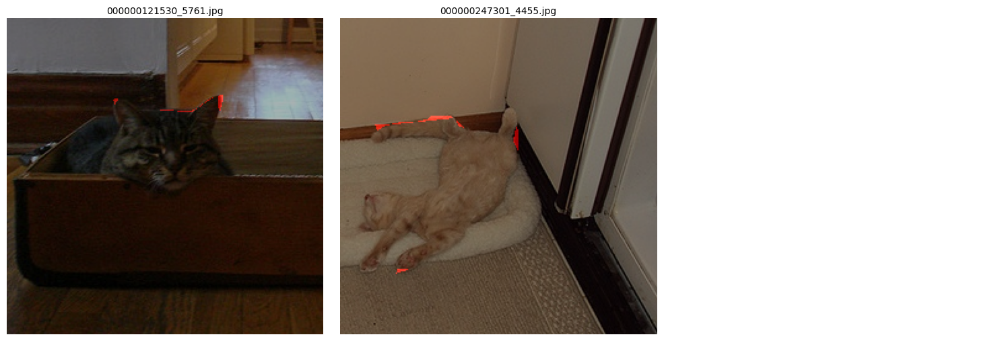

val
✅ Очень вытянутых объектов не обнаружено.
test
✅ Очень вытянутых объектов не обнаружено.


In [3]:
from practicum_work.scripts.eda_utils import check_extreme_aspect_ratio
from practicum_work.scripts.eda_utils import process_warnings
from practicum_work.scripts.visual_utils import visualize_images

for split in data_splits:
    print(split["name"])
    warnings = check_extreme_aspect_ratio(split["paths"][1])
    if warnings:
        images, masks = process_warnings(warnings)
        visualize_images(images, masks)

### 1.1.9 Проверка на "дыры" внутри объектов
Проверяет, нет ли больших дыр внутри объекта.

In [2]:
from practicum_work.scripts.eda_utils import check_holes_in_objects
from practicum_work.scripts.eda_utils import process_warnings
from practicum_work.scripts.visual_utils import visualize_images

for split in data_splits:
    print(split["name"])
    warnings = check_holes_in_objects(split["paths"][1])
    if warnings:
        images, masks = process_warnings(warnings)
        visualize_images(images, masks)

train
✅ Больших дыр внутри объектов не обнаружено.
val
✅ Больших дыр внутри объектов не обнаружено.
test
✅ Больших дыр внутри объектов не обнаружено.


## 1.2 Визуальный анализ и редактирование разметки
В ходе автоматических проверок был обнаружен ряд проблемных масок, которые нужно исправить.
Ввиду небольшого размера датасета проведем дополнительный визуальный контроль и ручную правку масок с помощью утилиты [**LabelMe**](https://github.com/wkentaro/labelme).

### 1.2.1 Конвертация png-масок в json формат
Для использования имеющихся масок при разметке в **LabelMe**, нужно преобразовать их в json формат.

In [2]:
from practicum_work.scripts.convert_png_to_json import png_to_json_autoload

png_to_json_autoload(
    data_root="practicum_work/data/train_dataset_for_students",
    class_map={1: "cat", 2: "dog"}
)


🔄 Обработка: TRAIN
✅ train: обработано 200 файлов

🔄 Обработка: VAL
✅ val: обработано 120 файлов

🔄 Обработка: TEST
✅ test: обработано 120 файлов

🎉 Готово: создано 440 JSON-файлов в practicum_work\data\train_dataset_for_students\json/


### 1.2.2 Ручная доразметка масок
При ручной доразметке в **LabelMe** использовался AI ассистент SAM2, который значительно ускорил процесс и сделал маски значительно точнее.
В ходе разметки, были обнаружены два файла, на которых в качестве кошек были выделены другие объекты:
* practicum_work\data\train_dataset_for_students\img\train\000000148827_6207.jpg - низкое качество, изображен не "кот".
* practicum_work\data\train_dataset_for_students\img\train\000000149184_281.jpg - это кухонная деревянная подставка.

Эти два файла были удалены из обучающей выборки.

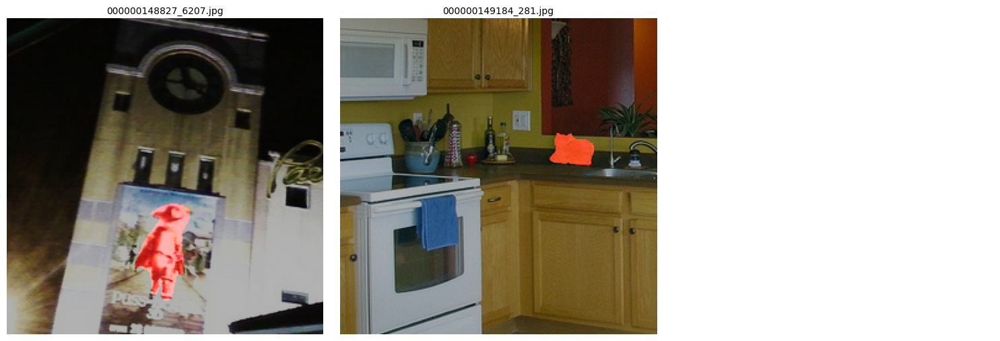

In [6]:
from practicum_work.scripts.visual_utils import visualize_images
from pathlib import Path

deleted_files = [Path(r"practicum_work\data\train_dataset_for_students\img\train\000000148827_6207.jpg"), Path(r"practicum_work\data\train_dataset_for_students\img\train\000000149184_281.jpg")]
deleted_masks = [Path(r"practicum_work\data\train_dataset_for_students\labels\train\000000148827_6207.png"), Path(r"practicum_work\data\train_dataset_for_students\labels\train\000000149184_281.png")]

visualize_images(deleted_files, deleted_masks)

### 1.2.3 Конвертация json-масок в png формат
Измененные в **LabelMe** маски были автоматически сохранены в json формате. Выполним их обратную конвертацию в png формат.

In [2]:
from practicum_work.scripts.convert_json_to_png import json_to_semantic_mask

json_to_semantic_mask(
    data_root="practicum_work/data/train_dataset_for_students",
    class_mapping={1: "cat", 2: "dog"}
)


🔄 Сохранение масок: TRAIN
✅ train: сохранено 198 масок

🔄 Сохранение масок: VAL
✅ val: сохранено 120 масок

🔄 Сохранение масок: TEST
✅ test: сохранено 120 масок

🎉 Готово: обновлено 438 масок в practicum_work\data\train_dataset_for_students\labels_fixed/


### 1.2.4 Сравнение масок до и после коррекции
Отобразим маски до и после доразметки, наложив их на соотвествующие изображения.
**Красным** цветом выделены удаленные части масок, **зеленым** цветом - добавленные части.
Выведем экземпляры с большими изменениями масок.

✅ Визуализация сохранена: practicum_work\reports\figures\mask_comparisons.png
   Показано 17 изменённых масок.


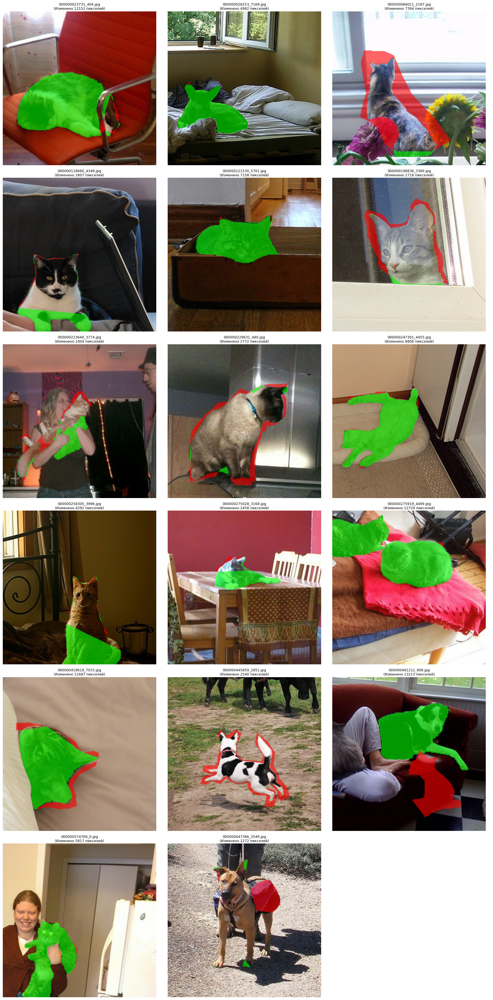

In [4]:
from practicum_work.scripts.visual_utils import compare_masks

compare_masks(
    img_dir="practicum_work/data/train_dataset_for_students/img",
    old_mask_dir="practicum_work/data/train_dataset_for_students/labels",
    new_mask_dir="practicum_work/data/train_dataset_for_students/labels_fixed",
    save_path="practicum_work/reports/figures/mask_comparisons.png",
    class_labels={1: "cat", 2: "dog"},
    threshold=2048,  # только если изменилось > 2048 пикселей
    cols=3
)

## 1.2 EDA
Проведем EDA на доразмеченной обучающей выборке

### 1.2.1 Анализ баланса классов

Найдено масок: 198

📊 Детальный баланс классов:
Класс  Число изображений с классом Доля изображений с классом (%) Среднее число инстансов на изображение Общая доля пикселей (%)
  cat                           98                           49.5                                   0.49                    54.4
  dog                          100                           50.5                                   0.51                    45.6
✅ Отчёт сохранён: practicum_work\reports\figures\class_balance_detailed.png


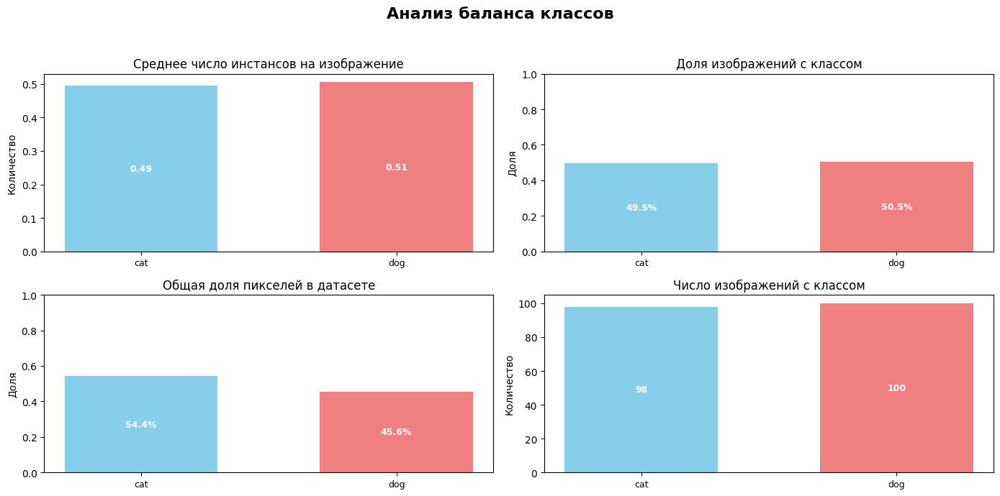

,Класс,Число изображений с классом,Доля изображений с классом (%),Среднее число инстансов на изображение,Общая доля пикселей (%)
0,cat,98,49.5,0.49,54.4
1,dog,100,50.5,0.51,45.6


In [4]:
from practicum_work.scripts.eda_utils import analyze_class_balance

analyze_class_balance(
    mask_dir="practicum_work/data/train_dataset_for_students/labels",
    class_labels={1: "cat", 2: "dog"},
    split_dirs=["train"],
    figsize=(14, 7),
    save_path="practicum_work/reports/figures/class_balance_detailed.png"
)

### 1.2.2 Распределение площади объектов

Найдено масок: 198
✅ Гистограмма сохранена: practicum_work\reports\figures\area_distribution_percent.png

📊 Статистика по площадям объектов (в % от изображения):
Класс  Число объектов Средняя площадь (%) Медиана площади (%) Min (%) Max (%) 25% (%) 75% (%)
  cat             120                8.27                7.39    0.01   26.13    1.76   12.22
  dog             107                7.77                6.12    0.02   25.92    3.25   11.46


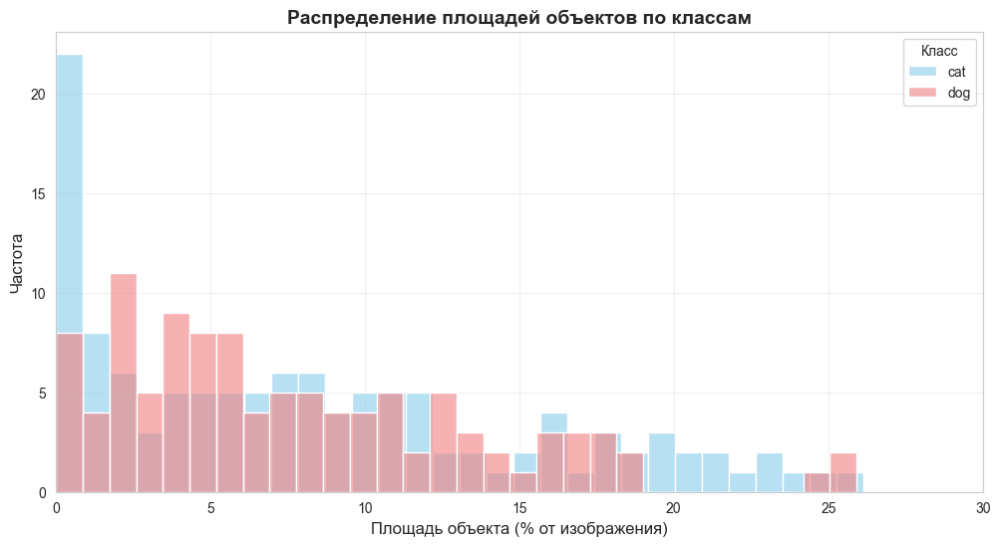

In [3]:
from practicum_work.scripts.eda_utils import analyze_object_area_distribution
analyze_object_area_distribution(
    mask_dir="practicum_work/data/train_dataset_for_students/labels",
    img_dir="practicum_work/data/train_dataset_for_students/img",
    class_labels={1: "cat", 2: "dog"},
    split_dirs=["train"],
    bins=30,
    figsize=(12, 6),
    save_path="practicum_work/reports/figures/area_distribution_percent.png",
)